### 负责人 廖光茂 贡献者 廖光茂

In [1]:
import numpy as np
from skyfield import api, almanac
from datetime import timedelta
from skyfield.api import wgs84,E,W,S,N
from pytz import timezone
zone = timezone('Asia/Shanghai')
ts = api.load.timescale()
eph = api.load('de421.bsp')

## 选择日食/月食计算，设置成影天体P与受影天体Q以及它们的半径

In [2]:
Rs = 696000000.0 #太阳半径，国际单位制，下同
geoc=1
latitude=37.5359
longitude=122.0496
height=110.0
def lunarORsolar(lunar, geoc=1, latitude=37.5359, longitude=122.0496, height=110.0): #关键字参数，设置默认值
    Rs = 696000000.0
    S = eph[10] #太阳
    if lunar == 0: #日食
        P = eph[301] #成影天体为月球
        Rp = 1737400.0 #月球半径
        Rq = 6378136.6 #地球半径
        if geoc == 0: #测站观
            Q = eph[399] + wgs84.latlon(latitude, longitude, height) #测站的ICRS坐标
        else: Q = eph[399] #全球观
    else: #月食
        P = eph[399]
        Q = eph[301]
        Rq = 1737400.0
        Rp = 6378136.6
    return Rp, Rq, S, Q, P

In [3]:
while True:
    lunar = int(input('日食计算请输入0，月食计算请输入1： '))
    print('>>>lunar=', lunar)
    if lunar == 0:
        geoc = int(input('测站观请输入0，全球观请输入1： '))
        print('>>>geoc=', geoc)
        if geoc == 0:
            latitude = float(input('请输入测站地理纬度：'))
            longitude = float(input('请输入测站地理经度：'))
            height = float(input('请输入测站海拔高度：'))
            print('>>>latitude=', latitude)
            print('>>>longitude=', longitude)
            print('>>>height=', height)
            bluffton = wgs84.latlon(latitude, longitude, height)
            break
        else: 
            break
    else: 
        break


日食计算请输入0，月食计算请输入1： 0
>>>lunar= 0
测站观请输入0，全球观请输入1： 0
>>>geoc= 0
请输入测站地理纬度：37.5370
请输入测站地理经度：122.0560
请输入测站海拔高度：110.0
>>>latitude= 37.537
>>>longitude= 122.056
>>>height= 110.0


In [4]:
Rp, Rq, S, Q, P = lunarORsolar(lunar, geoc, latitude, longitude, height)
print('参数设置如下：')
print('Rp=', Rp)
print('Rq=', Rq)
print('S=', S)
print('P=', P)
print('Q=', Q)

参数设置如下：
Rp= 1737400.0
Rq= 6378136.6
S= 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 10 SUN
P= Sum of 2 vectors:
 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 3 EARTH BARYCENTER
 'de421.bsp' segment 3 EARTH BARYCENTER -> 301 MOON
Q= Sum of 3 vectors:
 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 3 EARTH BARYCENTER
 'de421.bsp' segment 3 EARTH BARYCENTER -> 399 EARTH
 Geodetic 399 EARTH -> WGS84 latitude +37.5370 N longitude 122.0560 E elevation 110.0 m


## 计算影锥参数

[![z0dltA.jpg](https://s1.ax1x.com/2022/12/01/z0dltA.jpg)](https://imgse.com/i/z0dltA)

## 影锥参数公式
### $r_p = ||\vec{SP}||$&emsp;$r_q = ||\vec{SQ}||$
### $\vec{n} = \frac{-\vec{SP}}{||\vec{SP}||}$&emsp;$\vec{SO} = (\vec{SQ}\cdot\vec{n})\vec{n}$ &emsp;$\vec{OP} = \vec{SP} - \vec{SO}$
### $\vec{r} = \vec{QO} = \vec{SO} - \vec{SQ}$
### $\dot{\vec{r}} = \displaystyle\lim_{\Delta t \rightarrow 0}\frac{\vec{r}(t+\Delta t) - \vec{r}(t)}{\Delta t}$
### $sinf_1 = \frac{R_s + R_p}{r_p}$&emsp;$sinf_2 = \frac{R_s - R_p}{r_p}$
### $\vec{PV} = \frac{R_p}{sinf_1}\vec{n}$&emsp;$\vec{PW} = -\frac{R_p}{sinf_2}\vec{n}$
### $\vec{OW} = \vec{OP} + \vec{PW}$&emsp;$\vec{OV} = \vec{OP} + \vec{PV}$
### $c = -(\vec{SQ}\cdot\vec{n})(1-\frac{R_p}{R_s}) - r_p$
### $u_1 = ||\vec{OC}|| = ||\vec{OV}||tanf_1 = -\frac{(\vec{SQ}\cdot\vec{n})(1+\frac{R_p}{R_s}) - r_p}{\sqrt{(r_p/R_s)^2 - (1 + R_p/R_s)^2}}$
### $u_2 = ||\vec{OA}|| = ||\vec{OW}||tanf_2 = -\frac{c}{\sqrt{(r_p/R_s)^2 - (1 + R_p/R_s)^2}}$

In [5]:
def parameters(t):
    #视矢径（已改正光行差）
    SQ = -Q.at(t).observe(S).position.m
    SP = -P.at(t).observe(S).position.m
    sp = np.sqrt(SP.dot(SP))
    sq = np.sqrt(SQ.dot(SQ))
    n = -SP/sp #基本面法向量
    SO = (SQ.dot(n))*n
    OP = SP - SO
    QO = SO -SQ
    qo = np.sqrt(QO.dot(QO))
    
    sinf1 = (Rs + Rp)/sp
    sinf2 = (Rs - Rp)/sp

    PV = (Rp/sinf1)*n
    PW = -(Rp/sinf2)*n

    OW = OP + PW
    OV = OP + PV
    c = -(SQ.dot(n))*(1-Rp/Rs)-sp

    u1 = (-(SQ.dot(n))*(1+Rp/Rs)-sp)/np.sqrt((sp/Rs)**2-(1+Rp/Rs)**2)
    u2 = c/np.sqrt((sp/Rs)**2-(1-Rp/Rs)**2)
    
    return u1, u2, qo

#单独取出某一时刻t的影心距、半影半径、本影半径
def PenumbraRadius(t):
    u1, u2, qo = parameters(t)
    return u1

def UmbraRadius(t):
    u1, u2, qo = parameters(t)
    return u2

def ShadowCenterDis(t):
    u1, u2, qo = parameters(t)
    return qo

#test
t = ts.now()
print(PenumbraRadius(t))
print(UmbraRadius(t))
print(ShadowCenterDis(t))

1439293.2695408592
-2034060.6400934379
367845204.2181927


## 0.618法求单峰函数极值（为求影心距极小值、食分极大值）

In [6]:
def GoldMinimum(func, xst, xet, eps, xtt):
    Gold1 = 0.618033988
    Gold2 = 1.0 - Gold1
    ft = func(xtt)
    #Timescale对象调用.tdb方法获得数值型的儒略日时间
    xs = xst.tdb
    xe = xet.tdb
    xt = xtt.tdb
    while np.abs(xe-xs)>eps: 
        if xe-xt > xt-xs: #按黄金分割比例选取比较点
            x = Gold1*xt + Gold2*xe
        else: x = Gold1*xt + Gold2*xs
        f = func(ts.tdb_jd(x))
        if f<ft:
            x, xt = xt, x
            ft = f
        if xt>x:  #更新区间
            xs = x
        else: xe = x
    else: xmin = x
    return ft, ts.tdb_jd(xmin)

In [7]:
def GoldMaximum(func, xst, xet, eps, xtt):
    Gold1 = 0.618033988
    Gold2 = 1.0 - Gold1
    ft = func(xtt)
    #Timescale对象调用.tdb方法获得数值型的儒略日时间
    xs = xst.tdb
    xe = xet.tdb
    xt = xtt.tdb
    while np.abs(xe-xs)>eps:
        if xe-xt > xt-xs:
            x = Gold1*xt + Gold2*xe
        else: x = Gold1*xt + Gold2*xs
        f = func(ts.tdb_jd(x))
        if f>ft:
            x, xt = xt, x
            ft = f
        if xt>x:
            xs = x
        else: xe = x
    else: xmax = x
    return ft, ts.tdb_jd(xmax)


## 判断食的类型
### 做一次判断：影心距极小时刻影心距、本影半径、半影半径之间的比较

In [8]:
def EclipseTypes(rmin, u1, u2):
    ec = 0
    iscenter = 0 #储存是否发生中心食
    
    if rmin - Rq <= 0:
        iscenter = 1 #发生中心食
    #日食判据    
    if lunar == 0:
        if geoc != 0: #全球观判据
            if rmin-Rq >= u1:
                ec = 0 #不发生日食
            elif rmin-Rq >= np.abs(u2):
                ec = 1 #发生日偏食
            elif u2 <= 0:
                ec = 2 #发生日全食
            else: ec = 3 #发生日环食
            return ec, iscenter
        else: #测站观判据
            if rmin > u1:
                ec = 0
            elif rmin > np.abs(u2):
                ec = 1
            elif u2<=0:
                ec = 2
            else:
                ec = 3
            return ec, iscenter
    else: #月食判据
        if rmin-Rq >= u1:
            ec = 0 #不发生月食
        elif rmin-Rq >= np.abs(u2): #发生半影食
            if rmin + Rq >= u1:
                ec = 1 #发生半影月偏食
            else: ec = 2 #发生半影月全食
        else: #发生本影食
            if rmin + Rq >= np.abs(u2):
                ec = 3 #发生月偏食
            else: ec = 4 #发生月全食
        return ec, iscenter

## 二分法迭代求根

In [9]:
def FindRoot(func, t1t, t2t, eps):
    f1 = func(t1t)
    f2 = func(t2t)
    if f1*f2>0:
        return 0  #错误代码，表示选择的区间内无极值
    
    t1=t1t.tdb
    t2=t2t.tdb

    while True:    
        t3 = (t1+t2)/2.0
        f3 = func(ts.tdb_jd(t3))
        if f1*f3>0:
            t1 = t3
            f1 = f3
        else: t2 =t3

        if (np.abs(t2 - t1)<eps):
            break
    return ts.tdb_jd(t3)

## 计算朔望时间作为计算初值

In [10]:
#设置计算范围
T0 = ts.utc(2020, 1, 1)
T1 = ts.utc(2050, 1, 1)

t, y = almanac.find_discrete(T0, T1, almanac.moon_phases(eph))

#取出朔、望时间
newmoon = []
fullmoon = []
for ti, yi in zip(t, y):
    if yi == 0:
        newmoon.append(ti)
    if yi == 2:
        fullmoon.append(ti)
#test
for i in range(0,11):
    print(newmoon[i])
for i in range(0,11):
    print(fullmoon[i])    
#测试寻找极值时，时间范围的选取   
formerTime = ts.tdb_jd(newmoon[0].tdb-1)
latterTime = ts.tdb_jd(newmoon[0].tdb+1)
print(formerTime,newmoon[0],latterTime)

<Time tt=2458873.4049640023>
<Time tt=2458903.1480309176>
<Time tt=2458932.8953934223>
<Time tt=2458962.60208751>
<Time tt=2458992.2361199493>
<Time tt=2459021.7795910025>
<Time tt=2459051.232020212>
<Time tt=2459080.6130663627>
<Time tt=2459109.959280424>
<Time tt=2459139.314029594>
<Time tt=2459168.714125663>
<Time tt=2458859.307262698>
<Time tt=2458888.8155793706>
<Time tt=2458918.242289332>
<Time tt=2458947.608499815>
<Time tt=2458976.9488733243>
<Time tt=2459006.301071533>
<Time tt=2459035.698308778>
<Time tt=2459065.166611384>
<Time tt=2459094.7244639685>
<Time tt=2459124.3794568228>
<Time tt=2459154.1182686524>
<Time tt=2458872.404964003> <Time tt=2458873.4049640023> <Time tt=2458874.4049640023>


## 寻找影心距极小值与相应的食甚时间，同时返回食的类型

In [11]:
def findEclipse(iniTime, lunar, geoc):
    formerTime = ts.tdb_jd(iniTime.tdb-3)
    latterTime = ts.tdb_jd(iniTime.tdb+3)
    if lunar == 0:
        rmin, tmin = GoldMinimum(ShadowCenterDis, formerTime, latterTime, 0.001/86400, iniTime)
        u1 = PenumbraRadius(tmin)
        u2 = UmbraRadius(tmin)
        ec, iscenter = EclipseTypes(rmin, u1, u2)
    else:
        rmin, tmin = GoldMinimum(ShadowCenterDis, formerTime, latterTime, 0.001/86400, iniTime)
        u1 = 1.02*PenumbraRadius(tmin) #对于月食，需要考虑地球大气的影响，半影半径与本影半径还要乘以修正系数1.02
        u2 = 1.02*UmbraRadius(tmin)
        ec, iscenter = EclipseTypes(rmin, u1, u2)      
    
    return rmin, tmin, ec, iscenter, formerTime, latterTime

#test
rmin, tmin, ec, iscenter, formerTime, latterTime = findEclipse(newmoon[0], lunar, geoc)
print(rmin, tmin, ec, iscenter)

19141055.600264918 <Time tt=2458873.3152017524> 0 0


## 食的各个阶段的判断函数
### 根据各阶段起始时刻的临界条件，将各项移到一边从而定义一个时间的函数，该函数的零点即为各阶段的起止时刻

In [12]:
def SolarEclipse_StartEnd(t):
    r = ShadowCenterDis(t)
    u1 = PenumbraRadius(t)
    return r - Rq - u1

def SolarEclipse_ShijiShengguang(t):
    r = ShadowCenterDis(t)
    u2 = UmbraRadius(t)
    return r - Rq - np.abs(u2)

def Cezhan_StartEnd(t):
    r = ShadowCenterDis(t)
    u1 = PenumbraRadius(t)
    return r - u1

def Cezhan_ShijiShengguang(t):
    r = ShadowCenterDis(t)
    u2 = UmbraRadius(t)
    return r - np.abs(u2)

def LunarEclipse_StartEnd(t):
    r = ShadowCenterDis(t)
    u1 = 1.02*PenumbraRadius(t)
    return r - Rq - u1

def LunarEclipse_ChukuiFuyuan(t):
    r = ShadowCenterDis(t)
    u2 = 1.02*UmbraRadius(t)
    return r-Rq-np.abs(u2)

def LunarEclipse_ShijiShengguang(t):
    r = ShadowCenterDis(t)
    u2 = 1.02*UmbraRadius(t)
    return r + Rq + u2



## 食分计算
### 月食： 本影食分$g = \frac{-u_2 + R_m - r}{2R_m}$ 半影食分：$g = \frac{u_1 + R_m - r}{2R_m}$

### 日食食分（测站观）： $g = \frac{u_1 - r}{u_1 + u_2}$

In [13]:
#定义月食的本影食分函数
def Lunar_benShifen(t):
    r = ShadowCenterDis(t)
    u2 = 1.02*UmbraRadius(t)
    Rm = 1737400.0
    return (- u2 + Rm - r)/(2 * Rm)
#定义月食的半影时分函数
def Lunar_banShifen(t):
    r = ShadowCenterDis(t)
    u1 = 1.02*PenumbraRadius(t)
    Rm = 1737400.0
    return (u1 + Rm - r)/(2 * Rm)

#定义日食的食分函数
def Solar_Shifen(t):
    r = ShadowCenterDis(t)
    u1 = PenumbraRadius(t)
    u2 = UmbraRadius(t)
    return (u1 - r)/(u1 + u2)

## 寻找离tmin最近的日出日落
### 在测站观测日食时，还涉及到日出日落的问题，日食的某个阶段如果发生在日出之前或日落之后，则无法观测到
### 算法思路：寻找离tmin最近的日出日落，有两种情形，日落--tmin--日出，日出--tmin--日落，分别判断即可

In [14]:
def SunRiseSet(tmin):
    tmintdb = tmin.tdb
    tftdb = tmin.tdb - 1
    tltdb = tmin.tdb + 1
    
    t0 = ts.tdb_jd(tftdb)
    t1 = ts.tdb_jd(tltdb)
    
    t, y = almanac.find_discrete(t0, t1, almanac.sunrise_sunset(eph, bluffton))
    #取出离tmin最近的日出日落
    t = t[1:3]
    y = y[1:3]
    
    return t, y
    

In [15]:
def Select1(t, y, starttime, tmin, endtime): #针对日偏食情形，只有日偏食始（初亏）、食甚、日偏食终（复圆）
    print('\n 日偏食')
    if y[0] == 0: #tmin在日落与日出之间
        if starttime.tdb < t[0].tdb:
            print('初亏：{}'.format(starttime.astimezone(zone)))
            print('日落：{}'.format(t[0].astimezone(zone)))
        elif endtime.tdb > t[1].tdb:
            print('日出：{}'.format(t[1].astimezone(zone)))
            print('复圆：{}'.format(endtime.astimezone(zone)))
        
    else:#tmin在日出与日落之间
        g, tg = GoldMaximum(Solar_Shifen, starttime, endtime, 0.001/86400, tmin)
        print('最大食分：{}'.format(g))
        
        print('日出：{}'.format(t[0].astimezone(zone)))
        if starttime.tdb > t[0].tdb:
            print('初亏：{}'.format(starttime.astimezone(zone)))
            
        print('食甚：', tmin.astimezone(zone))
        
        if endtime.tdb < t[1].tdb:
            print('复圆：{}'.format(endtime.astimezone(zone))) 
        print('日落：{}'.format(t[1].astimezone(zone)))
    
        

In [16]:
def Select23(t, y, ec, starttime, shijitime, tmin, shengguangtime, endtime):
    if ec == 2:
        print('\n 日全食')
    else:
        print('\n 日偏食')
        
    if y[0] == 0: #tmin在日落与日出之间
        if shijitime.tdb < t[0].tdb:
            print('初亏：{}'.format(starttime.astimezone(zone)))
            print('食既：{}'.format(shijitime.astimezone(zone)))
            print('日落：{}'.format(t[0].astimezone(zone)))
        elif starttime.tdb < t[0].tdb:
            print('初亏：{}'.format(starttime.astimezone(zone)))
            print('日落：{}'.format(t[0].astimezone(zone)))
        elif shengguangtime.tdb > t[1].tdb:
            print('日出：{}'.format(t[1].astimezone(zone)))
            print('生光：{}'.format(shengguangtime.astimezone(zone)))
            print('复圆：{}'.format(endtime.astimezone(zone)))
        elif endtime.tdb > t[1].tdb:
            print('\n 日出：{}'.format(t[1].astimezone(zone)))
            print('复圆：{}'.format(endtime.astimezone(zone)))
    else:
        g, tg = GoldMaximum(Solar_Shifen, starttime, endtime, 0.001/86400, tmin)
        print('最大食分：{}'.format(g))
        
        print('\n 日出：{}'.format(t[0].astimezone(zone)))
        if starttime.tdb > t[0].tdb:
            print('初亏：{}'.format(starttime.astimezone(zone)))
        if shijitime.tdb > t[0].tdb:
            print('食既：{}'.format(shijitime.astimezone(zone)))
        
        print('食甚：', tmin.astimezone(zone))
        
        if shengguangtime.tdb < t[1].tdb:
            print('生光：{}'.format(shengguangtime.astimezone(zone)))
        if endtime.tdb < t[1].tdb:
            print('复圆：{}'.format(endtime.astimezone(zone))) 
        print('日落：{}'.format(t[1].astimezone(zone)))

## 寻找日月食并计算相关阶段的起止时间、最大食分

In [17]:
print('lunar = {}  geoc = {}  Rp = {}  Rq = {} \n  S = {}  \n  P = {}  \n  Q = {}'.format(lunar, geoc, Rp, Rq, S, P, Q))
if lunar == 0:
    for initime in newmoon:
        rmin, tmin, ec, iscenter, formerTime, latterTime = findEclipse(initime, lunar, geoc)
        if ec == 0:
            continue
        elif ec == 1:
            if geoc == 1:
                starttime = FindRoot(SolarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
                endtime = FindRoot(SolarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
                print('\n 日偏食')
                print('初亏：', starttime.astimezone(zone))
                print('食甚：', tmin.astimezone(zone))
                print('复圆：', endtime.astimezone(zone))
            else:
                starttime = FindRoot(Cezhan_StartEnd, formerTime, tmin, 0.001/86400)
                endtime = FindRoot(Cezhan_StartEnd, tmin, latterTime, 0.001/86400)
#######################################################################################################################################
                t, y = SunRiseSet(tmin)
                if (y[0]==0) and (t[0].tdb < starttime.tdb) and (endtime.tdb < t[1].tdb):
                    continue
                Select1(t, y, starttime, tmin, endtime)
#######################################################################################################################################                
            continue
        elif ec == 2:
            if geoc == 1:
                starttime = FindRoot(SolarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
                shijitime = FindRoot(SolarEclipse_ShijiShengguang, formerTime, tmin, 0.001/86400)
                shengguangtime = FindRoot(SolarEclipse_ShijiShengguang, tmin, latterTime, 0.001/86400)
                endtime = FindRoot(SolarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
                print('\n 日全食')
                print('初亏：', starttime.astimezone(zone))
                print('食既：', shijitime.astimezone(zone))
                print('食甚：', tmin.astimezone(zone))
                print('生光：', shengguangtime.astimezone(zone))
                print('复圆：', endtime.astimezone(zone))
            else:
                starttime = FindRoot(Cezhan_StartEnd, formerTime, tmin, 0.001/86400)
                shijitime = FindRoot(Cezhan_ShijiShengguang, formerTime, tmin, 0.001/86400)
                shengguangtime = FindRoot(Cezhan_ShijiShengguang, tmin, latterTime, 0.001/86400)
                endtime = FindRoot(Cezhan_StartEnd, tmin, latterTime, 0.001/86400)
#######################################################################################################################################
                t, y = SunRiseSet(tmin)
                if (y[0]==0) and (t[0].tdb < starttime.tdb) and (endtime.tdb < t[1].tdb):
                    continue
                Select23(t, y, ec, starttime, shijitime, tmin, shengguangtime, endtime)
#######################################################################################################################################                    
            continue
        elif ec == 3:
            if geoc == 1:
                starttime = FindRoot(SolarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
                shijitime = FindRoot(SolarEclipse_ShijiShengguang, formerTime, tmin, 0.001/86400)
                shengguangtime = FindRoot(SolarEclipse_ShijiShengguang, tmin, latterTime, 0.001/86400)
                endtime = FindRoot(SolarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
                print('\n 日环食')
                print('初亏：', starttime.astimezone(zone))
                print('食既：', shijitime.astimezone(zone))
                print('食甚：', tmin.astimezone(zone))
                print('生光：', shengguangtime.astimezone(zone))
                print('复圆：', endtime.astimezone(zone))
            else:
                starttime = FindRoot(Cezhan_StartEnd, formerTime, tmin, 0.001/86400)
                shijitime = FindRoot(Cezhan_ShijiShengguang, formerTime, tmin, 0.001/86400)
                shengguangtime = FindRoot(Cezhan_ShijiShengguang, tmin, latterTime, 0.001/86400)
                endtime = FindRoot(Cezhan_StartEnd, tmin, latterTime, 0.001/86400)
#######################################################################################################################################
                t, y = SunRiseSet(tmin)
                if (y[0]==0) and (t[0].tdb < starttime.tdb) and (endtime.tdb < t[1].tdb):
                    continue
                Select23(t, y, ec, starttime, shijitime, tmin, shengguangtime, endtime)
####################################################################################################################################### 
            continue
else:
    for initime in fullmoon:
        rmin, tmin, ec, iscenter, formerTime, latterTime = findEclipse(initime, lunar, geoc)
        if ec == 0:
            continue
        elif ec == 1:
            starttime = FindRoot(LunarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
            endtime = FindRoot(LunarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
            
            g, tg = GoldMaximum(Lunar_banShifen, starttime, endtime, 0.001/86400, tmin)
            print('\n 最大食分：{}'.format(g))
            
            print('半影月偏食始：', starttime.astimezone(zone))
            print('食甚：', tmin.astimezone(zone))
            print('半影月偏食终：', endtime.astimezone(zone))
            continue
        elif ec == 2:
            starttime = FindRoot(LunarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
            endtime = FindRoot(LunarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
            
            g, tg = GoldMaximum(Lunar_banShifen, starttime, endtime, 0.001/86400, tmin)
            print('\n 最大食分：{}'.format(g))
            
            print('半影月全食始：', starttime.astimezone(zone))
            print('食甚：', tmin.astimezone(zone))
            print('半影月全食终：', endtime.astimezone(zone))
            continue
        elif ec == 3:
            starttime = FindRoot(LunarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
            chukuitime = FindRoot(LunarEclipse_ChukuiFuyuan, formerTime, tmin, 0.001/86400)
            fuyuantime = FindRoot(LunarEclipse_ChukuiFuyuan, tmin, latterTime, 0.001/86400)
            endtime = FindRoot(LunarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
            
            g, tg = GoldMaximum(Lunar_benShifen, starttime, endtime, 0.001/86400, tmin)
            print('\n 最大食分：{}'.format(g))
            
            print('月偏食始：', starttime.astimezone(zone))
            print('初亏：', chukuitime.astimezone(zone))
            print('食甚：', tmin.astimezone(zone))
            print('复圆：', fuyuantime.astimezone(zone))
            print('月偏食终：', endtime.astimezone(zone))
            continue
        elif ec == 4:
            starttime = FindRoot(LunarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
            chukuitime = FindRoot(LunarEclipse_ChukuiFuyuan, formerTime, tmin, 0.001/86400)
            shijitime = FindRoot(LunarEclipse_ShijiShengguang, formerTime, tmin, 0.001/86400)
            shengguangtime = FindRoot(LunarEclipse_ShijiShengguang, tmin, latterTime, 0.001/86400)
            fuyuantime = FindRoot(LunarEclipse_ChukuiFuyuan, tmin, latterTime, 0.001/86400)
            endtime = FindRoot(LunarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
            
            g, tg = GoldMaximum(Lunar_benShifen, starttime, endtime, 0.001/86400, tmin)
            print('\n 最大食分：{}'.format(g))
            
            print('月全食始：', starttime.astimezone(zone))
            print('初亏：', chukuitime.astimezone(zone))
            print('食既：', shijitime.astimezone(zone))
            print('食甚：', tmin.astimezone(zone))
            print('生光：', shengguangtime.astimezone(zone))
            print('复圆：', fuyuantime.astimezone(zone))
            print('月全食终：', endtime.astimezone(zone))
            continue

lunar = 0  geoc = 0  Rp = 1737400.0  Rq = 6378136.6 
  S = 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 10 SUN  
  P = Sum of 2 vectors:
 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 3 EARTH BARYCENTER
 'de421.bsp' segment 3 EARTH BARYCENTER -> 301 MOON  
  Q = Sum of 3 vectors:
 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 3 EARTH BARYCENTER
 'de421.bsp' segment 3 EARTH BARYCENTER -> 399 EARTH
 Geodetic 399 EARTH -> WGS84 latitude +37.5370 N longitude 122.0560 E elevation 110.0 m

 日偏食
最大食分：0.6010881928731859
日出：2020-06-21 04:30:51.676606+08:00
初亏：2020-06-21 14:45:27.201818+08:00
食甚： 2020-06-21 15:59:39.513015+08:00
复圆：2020-06-21 17:05:21.272404+08:00
日落：2020-06-21 19:16:21.820331+08:00

 日偏食
最大食分：0.6736781713217455
日出：2030-06-01 04:32:23.882825+08:00
初亏：2030-06-01 14:31:42.428952+08:00
食甚： 2030-06-01 15:56:59.500937+08:00
复圆：2030-06-01 17:10:06.023273+08:00
日落：2030-06-01 19:07:06.167863+08:00

 日偏食
最大食分：0.5785225409869226
日出：2032-11-03 06:18:51.230558+08:00
初亏：2032-11-03 

## 验证结果
[nadc.china-vo.org](https://nadc.china-vo.org/eclipse/?map=arcgis&mapid=5cd32b831bfb43d08e5ee75e7b40d53d&mode=3d)

[lunar eclipse](https://eclipse.gsfc.nasa.gov/SEpubs/5MCLE.html)

[solar eclipse](https://eclipse.gsfc.nasa.gov/solar.html)

## 测站观日食结果对比（国家天文科学数据中心）
### 测站：+37.5370 N longitude 122.0560 E elevation 110.0 m
### NADC：偏食，食分：0.602 初亏	2020-06-21 14:44:28 食甚	2020-06-21 15:58:49 复圆	2020-06-21 17:04:38	
### 计算结果：日偏食，最大食分：0.6010881928731859，初亏：2020-06-21 14:45:27.201818+08:00，食甚： 2020-06-21 15:59:39.513015+08:00，复圆：2020-06-21 17:05:21.272404+08:00


## 全球观日食：找到的食的数目与类型与nasa给出的相同，计算结果与nasa给出的结果相对比，生光时间相差最大不超过1min30s,其余时间最大不超过1min
![jupyter](https://eclipse.gsfc.nasa.gov/SEplot/SEplot2001/SE2021Jun10A.GIF)
![jupyter](https://eclipse.gsfc.nasa.gov/SEplot/SEplot2001/SE2021Dec04T.GIF)
![jupyter](https://eclipse.gsfc.nasa.gov/SEplot/SEplot2001/SE2022Apr30P.GIF)

## 月食：在2020-2050（年首）找到70次月食，nasa给出69次，相比nasa还找到了一次2042.10.29的半影月偏食，利用skyfield也找到了这次月食。

In [18]:
from skyfield import eclipselib
from pytz import timezone
zone = timezone('Asia/Shanghai')

t0 = ts.utc(2042, 1, 1)
t1 = ts.utc(2043, 1, 1)
t, y, details = eclipselib.lunar_eclipses(t0, t1, eph)

for ti, yi in zip(t, y):
    print(str(ti.astimezone(zone))[:19],
          'y={}'.format(yi),
          eclipselib.LUNAR_ECLIPSES[yi])

2042-04-05 22:29:01 y=0 Penumbral
2042-09-29 18:44:37 y=1 Partial
2042-10-29 03:33:20 y=0 Penumbral


## 月食——与2021年中国天文年历对比
### 天文年历给出：
### 2021年5月26日 月全食 
半影食始$16^h46^m.2$ 初亏$17^h44^m.6$ 食既$19^h09^m.4$ 食甚$19^h18^m.7$ 生光$19^h28^m.0$ 复圆$20^h52^m.8$ 半影食终$21^h51^m.2$ 最大食分1.015

### 计算结果
最大食分：1.0195509406920977
月全食始： 2021-05-26 16:46:33.704240+08:00
初亏： 2021-05-26 17:44:57.015272+08:00
食既： 2021-05-26 19:08:49.371885+08:00
食甚： 2021-05-26 19:19:15.828797+08:00
生光： 2021-05-26 19:29:42.060162+08:00
复圆： 2021-05-26 20:53:34.259623+08:00
月全食终： 2021-05-26 21:51:58.922731+08:00

### 2021年11月19日 月偏食 
半影食始$14^h00^m.4$ 初亏$15^h18^m.4$ 食甚$17^h02^m.9$ 复圆$18^h47^m.4$ 半影食终$20^h05^m.5$ 最大食分0.978

### 计算结果
最大食分：0.982916291433118
月偏食始： 2021-11-19 14:00:54.559610+08:00
初亏： 2021-11-19 15:18:53.298504+08:00
食甚： 2021-11-19 17:03:40.151991+08:00
复圆： 2021-11-19 18:48:26.219804+08:00
月偏食终： 2021-11-19 20:06:28.199960+08:00

# 日食见食区域的计算

## 原理：迭代法解三角——影锥(顶点为V/W)某一母线与基本面交点T、与地表交点Z、地心Q组成的三角形
## $\vec{QZ} = \vec{QT} + \beta \cdot \vec{tv}$ 
## $\vec{QZ} = \vec{QT} + \beta \cdot (\pm \vec{tw})$
## 三角形QTZ满足：$||\vec{QZ}||^2 = ||\vec{QT}||^2 + \beta^2 - 2\beta \vec{QT} \cdot \vec{tv}$
## 注：$\vec{tv}$与$\vec{tw}$是单位向量
## 迭代法：$\beta$ 与 $\vec{QZ}$ 待求，先以赤道半径代入$||\vec{QZ}||$求得$\beta$，再将所求$\beta$代入求得$\vec{QZ}$，再利用$\vec{QZ}$求Z点经纬度，再利用经纬度作地球椭球体改正求得新的$||\vec{QZ}||$，如此反复直到达到一定精度

## 从地心ICRF坐标获得对应的wgs经纬度与地心距

In [19]:
from skyfield.positionlib import build_position
def geog(icrf):
    geog_position = build_position(icrf/149597870700, t=t, center = 399)
    lat, lon = wgs84.latlon_of(geog_position)
    latH = lat.radians
    lonH = lon.radians
    Re = 6378136.6
    f = 1/298.257
    Rg = Re*np.sqrt(1-(2*f-f**2)*(np.sin(latH))**2)
    return lat, lon, Rg

## 定义函数—-传递中心线计算需要的参数

In [20]:
def passpara(t):
    S, P , Q = eph['Sun'], eph['Moon'], eph['earth']
    SQ = -Q.at(t).observe(S).position.m
    SP = -P.at(t).observe(S).position.m
    sp = np.sqrt(SP.dot(SP))
    sq = np.sqrt(SQ.dot(SQ))
    n = -SP/sp #基本面法向量
    SO = (SQ.dot(n))*n
    OP = SP - SO
    QO = SO -SQ
    qo = np.sqrt(QO.dot(QO))
    
    sinf1 = (Rs + Rp)/sp
    sinf2 = (Rs - Rp)/sp

    PV = (Rp/sinf1)*n
    PW = -(Rp/sinf2)*n

    OW = OP + PW
    OV = OP + PV
    c = -(SQ.dot(n))*(1-Rp/Rs)-sp

    u1 = (-(SQ.dot(n))*(1+Rp/Rs)-sp)/np.sqrt((sp/Rs)**2-(1+Rp/Rs)**2)
    u2 = c/np.sqrt((sp/Rs)**2-(1-Rp/Rs)**2)
    
    return qo, QO, n, u1, u2, OV, OW

## 迭代计算中心线

In [21]:
def Centerline(t):
    Re = 6378136.6
    R = Re
    r, QO, n, u1, u2, OV, OW = passpara(t)
    while True:
        delta = R**2 - r**2
        if delta < 0:
            return 'null', 'null', 'null'
        else:    
            k = np.sqrt(delta)
            QC = QO + k*n
            lat, lon, Rg = geog(QC)
            if np.abs(Rg - R) > 1:
                R = Rg
            else: 
                return lat, lon, Rg

## 数值计算影心速度

In [22]:
def Vr(t):
    tplus = ts.tdb_jd(t.tdb + 0.000001/86400)
    delta = 0.000001 #s
    rt = passpara(t)[1]
    rtp = passpara(tplus)[1]
    vr = (rtp - rt)/delta #m/s
    return vr

## 返回矢量叉乘方向的单位向量

In [23]:
def cross(A, B):
    C = []
    x = A[1]*B[2] - A[2]*B[1]
    y = A[2]*B[0] - A[0]*B[2]
    z = A[0]*B[1] - A[1]*B[0]
    s = np.sqrt(x**2 + y**2 + z**2)
    C.append(x/s)
    C.append(y/s)
    C.append(z/s)
    aC = np.array(C)
    return aC

## 传递计算界线需要的参数

In [24]:
def boundarypara(t):
    qo, QO, n, u1, u2, OV, OW = passpara(t)
    u2 = np.abs(u2)
    p = cross(Vr(t), n)
    OT1 = -u1 * p
    OT2 = -u2 * p
    OT3 = u2 * p
    OT4 = u1 * p
    
    QT1 = QO + OT1
    QT2 = QO + OT2
    QT3 = QO + OT3
    QT4 = QO + OT4
    
    qt1 = QT1/np.sqrt(QT1.dot(QT1))
    qt2 = QT2/np.sqrt(QT2.dot(QT2))
    qt3 = QT3/np.sqrt(QT3.dot(QT3))
    qt4 = QT4/np.sqrt(QT4.dot(QT4))
    
    s_QT1 = np.sqrt(QT1.dot(QT1))
    s_QT2 = np.sqrt(QT2.dot(QT2))
    s_QT3 = np.sqrt(QT3.dot(QT3))
    s_QT4 = np.sqrt(QT4.dot(QT4))
    
    
    
    T1V = OV - OT1
    T2W = OW - OT2
    T3W = OW - OT3
    T4V = OV - OT4
    
    t1v = T1V/np.sqrt(T1V.dot(T1V))
    t2w = T2W/np.sqrt(T2W.dot(T2W))
    t3w = T3W/np.sqrt(T3W.dot(T3W))
    t4v = T4V/np.sqrt(T4V.dot(T4V))
    
    return QT1, s_QT1, qt1, t1v,  QT4, s_QT4, qt4, t4v, QT2, s_QT2, qt2, t2w, QT3, s_QT3, qt3, t3w


## 定义界线计算函数

### 半影界线

In [25]:
def z1(t):
    Re = 6378136.6
    R = Re
    QT1, s_QT1, qt1, t1v = boundarypara(t)[0:4]
    n = s_QT1
    ang = qt1.dot(t1v)
    while True:
        delta = (2*ang*n)**2 - 4*(n**2-R**2)
        if delta < 0:
            return 'null', 'null', 'null'
        else: 
            m = 0.5*(-ang*n + np.sqrt(delta))
            QZ1 = QT1 + m*t1v
            lat_z1, lon_z1, Rg_z1 = geog(QZ1)
            if np.abs(Rg_z1 - R) > 0.001:
                R = Rg_z1
            else: 
                return lat_z1, lon_z1, Rg_z1

In [26]:
def z4(t):
    Re = 6378136.6
    R = Re
    QT4, s_QT4, qt4, t4v = boundarypara(t)[4:8]
    n = s_QT4
    ang = qt4.dot(t4v)
    while True:
        delta = (2*ang*n)**2 - 4*(n**2-R**2)
        if delta < 0:
            return 'null', 'null', 'null'
        else: 
            m = 0.5*(-ang*n + np.sqrt(delta))
            QZ4 = QT4 + m*t4v
            lat_z4, lon_z4, Rg_z4 = geog(QZ4)
            if np.abs(Rg_z4 - R) > 0.001:
                R = Rg_z4
            else: 
                return lat_z4, lon_z4, Rg_z4

### 本影界线

In [27]:
def z2(t):
    Re = 6378136.6
    R = Re
    QT2, s_QT2, qt2, t2w = boundarypara(t)[8:12]
    qo, QO, n, u1, u2, OV, OW = passpara(t)
    if (OW.dot(OV)) < 0: # VOW构型
        t2w = -t2w
    n = s_QT2
    ang = qt2.dot(t2w)
    while True:
        delta = (ang*n)**2 - 4*(n**2-R**2)
        if delta < 0:
            return 'null', 'null', 'null'
        else: 
            m = 0.5*(-ang*n + np.sqrt(delta))
            QZ2 = QT2 + m*t2w
            lat_z2, lon_z2, Rg_z2 = geog(QZ2)
            if np.abs(Rg_z2 - R) > 0.001:
                R = Rg_z2
            else: 
                return lat_z2, lon_z2, Rg_z2

In [28]:
def z3(t):
    Re = 6378136.6
    R = Re
    QT3, s_QT3, qt3, t3w = boundarypara(t)[12:16]
    qo, QO, n, u1, u2, OV, OW = passpara(t)
    if (OW.dot(OV)) < 0: # VOW构型
        t3w = -t3w
    n = s_QT3
    ang = qt3.dot(t3w)
    while True:
        delta = (2*ang*n)**2 - 4*(n**2-R**2)
        if delta < 0:
            return 'null', 'null', 'null'
        else: 
            m = 0.5*(-ang*n + np.sqrt(delta))
            QZ3 = QT3 + m*t3w
            lat_z3, lon_z3, Rg_z3 = geog(QZ3)
            if np.abs(Rg_z3 - R) > 0.001:
                R = Rg_z3
            else: 
                return lat_z3, lon_z3, Rg_z3

## 生成中心线、界线的数据列表

## 时间序列的生成

In [29]:
from tqdm import tqdm

In [30]:
def TimeSequence(starttime, endtime):
    y = starttime.utc.year
    month = starttime.utc.month
    d = starttime.utc.day
    h = starttime.utc.hour
    m = starttime.utc.minute
    s = starttime.utc.second
    
    st = starttime.tdb
    et = endtime.tdb
    minutenum = (et - st)/(60/86400)
    #print(minutenum)
    minutelist = np.arange(m, m + minutenum, 1)
    #print(minutelist)
    #print(month)
    Timelist = ts.utc(y, month, d, h, minutelist)
    
    return Timelist

## 对“全球观”日食计算见食区域，首先计算并储存每次日食的时间数据

In [31]:
lunar = 0
geoc = 1
Rs = 696000000.0
Rp = 1737400.0
Rq = 6378136.6
S = eph[10]
P = eph[301]
Q = eph[399]

In [32]:
T0 = ts.utc(2020, 1, 1)
T1 = ts.utc(2040, 1, 1)

t, y = almanac.find_discrete(T0, T1, almanac.moon_phases(eph))
newmoon = []
for ti, yi in zip(t, y):
    if yi == 0:
        newmoon.append(ti)

In [33]:
AreaData = {}

In [34]:
print('lunar = {}  geoc = {}  Rp = {}  Rq = {} \n  S = {}  \n  P = {}  \n  Q = {}'.format(lunar, geoc, Rp, Rq, S, P, Q))
for initime in newmoon:  
    rmin, tmin, ec, iscenter, formerTime, latterTime = findEclipse(initime, lunar, geoc)
    if ec == 0:
        continue
    elif ec == 1:
        starttime = FindRoot(SolarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
        endtime = FindRoot(SolarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
        print('\n 日偏食始：', starttime.astimezone(zone))
        print('食甚：', tmin.astimezone(zone))
        print('日偏食终：', endtime.astimezone(zone))
        
        key = '日偏食 {}'.format(str(tmin.utc_iso())[0:10])
        value = (starttime, endtime, tmin)
        AreaData[key]=value
        
        continue
    elif ec == 2:
        starttime = FindRoot(SolarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
        shijitime = FindRoot(SolarEclipse_ShijiShengguang, formerTime, tmin, 0.001/86400)
        shengguangtime = FindRoot(SolarEclipse_ShijiShengguang, tmin, latterTime, 0.001/86400)
        endtime = FindRoot(SolarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
        
        key = '日全食 {}'.format(str(tmin.utc_iso())[0:10])
        value = (starttime, endtime, tmin)
        AreaData[key]=value
        
        print('\n 日全食始：', starttime.astimezone(zone))
        print('食既：', shijitime.astimezone(zone))
        print('食甚：', tmin.astimezone(zone))
        print('生光：', shengguangtime.astimezone(zone))
        print('日全食终：', endtime.astimezone(zone))
        continue
    elif ec == 3:
        starttime = FindRoot(SolarEclipse_StartEnd, formerTime, tmin, 0.001/86400)
        shijitime = FindRoot(SolarEclipse_ShijiShengguang, formerTime, tmin, 0.001/86400)
        shengguangtime = FindRoot(SolarEclipse_ShijiShengguang, tmin, latterTime, 0.001/86400)
        endtime = FindRoot(SolarEclipse_StartEnd, tmin, latterTime, 0.001/86400)
        
        key = '日环食 {}'.format(str(tmin.utc_iso())[0:10])
        value = (starttime, endtime, tmin)
        AreaData[key]=value
        
        print('\n 日环食始：', starttime.astimezone(zone))
        print('食既：', shijitime.astimezone(zone))
        print('食甚：', tmin.astimezone(zone))
        print('生光：', shengguangtime.astimezone(zone))
        print('日环食终：', endtime.astimezone(zone))
        continue

lunar = 0  geoc = 1  Rp = 1737400.0  Rq = 6378136.6 
  S = 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 10 SUN  
  P = Sum of 2 vectors:
 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 3 EARTH BARYCENTER
 'de421.bsp' segment 3 EARTH BARYCENTER -> 301 MOON  
  Q = Sum of 2 vectors:
 'de421.bsp' segment 0 SOLAR SYSTEM BARYCENTER -> 3 EARTH BARYCENTER
 'de421.bsp' segment 3 EARTH BARYCENTER -> 399 EARTH

 日环食始： 2020-06-21 11:46:40.470779+08:00
食既： 2020-06-21 12:48:24.906209+08:00
食甚： 2020-06-21 14:40:44.828857+08:00
生光： 2020-06-21 16:33:01.040159+08:00
日环食终： 2020-06-21 17:34:42.754461+08:00

 日全食始： 2020-12-14 21:34:31.430312+08:00
食既： 2020-12-14 22:33:10.061397+08:00
食甚： 2020-12-15 00:14:05.223804+08:00
生光： 2020-12-15 01:54:58.864191+08:00
日全食终： 2020-12-15 02:53:43.351531+08:00

 日环食始： 2021-06-10 16:13:03.171390+08:00
食既： 2021-06-10 17:50:11.799201+08:00
食甚： 2021-06-10 18:42:39.826102+08:00
生光： 2021-06-10 19:35:06.357779+08:00
日环食终： 2021-06-10 21:12:13.683485+08:00

 日全食始： 2021-12-0

In [35]:
print(AreaData)

{'日环食 2020-06-21': (<Time tt=2459021.658213597>, <Time tt=2459021.8999066954>, <Time tt=2459021.779097371>), '日全食 2020-12-14': (<Time tt=2459198.0664422954>, <Time tt=2459198.28810805>, <Time tt=2459198.1772500905>), '日环食 2021-06-10': (<Time tt=2459375.843198558>, <Time tt=2459376.0509591145>, <Time tt=2459375.9470950244>), '日全食 2021-12-04': (<Time tt=2459552.7298542913>, <Time tt=2459552.902350492>, <Time tt=2459552.816103517>), '日偏食 2022-04-30': (<Time tt=2459700.2823664607>, <Time tt=2459700.4444788364>, <Time tt=2459700.3633969487>), '日偏食 2022-10-25': (<Time tt=2459877.874767518>, <Time tt=2459878.0445493828>, <Time tt=2459877.959688677>), '日环食 2023-04-20': (<Time tt=2460054.5666805953>, <Time tt=2460054.7924729474>, <Time tt=2460054.6795432204>), '日环食 2023-10-14': (<Time tt=2460232.1288087494>, <Time tt=2460232.3730305913>, <Time tt=2460232.250950531>), '日全食 2024-04-08': (<Time tt=2460409.155517956>, <Time tt=2460409.3709651507>, <Time tt=2460409.2632274036>), '日环食 2024-10-02': (<

## 获取某次日食见食区域的经纬度数据

In [36]:
name = '日全食 2020-12-14' #在这里修改以获得不同日食的见食区域
starttime = AreaData[name][0]
endtime = AreaData[name][1]
tmin = AreaData[name][2]
print(starttime)
print(endtime)
print(tmin)

<Time tt=2459198.0664422954>
<Time tt=2459198.28810805>
<Time tt=2459198.1772500905>


In [37]:
timelist = TimeSequence(starttime, endtime)
print(timelist)

<Time tt=[2459198.0660785185 ... 2459198.287606296] len=320>


In [38]:
TS = timelist

In [39]:
latCenter = []
lonCenter = []
for t in tqdm(TS, position=0):
    if Centerline(t)[0] != 'null':
        latCenter.append(Centerline(t)[0].degrees)
        lonCenter.append(Centerline(t)[1].degrees)
latCenter = np.array(latCenter)
lonCenter = np.array(lonCenter)
print(latCenter)
print(lonCenter)

100%|███████████████████████████████████████████████████████████████████████████████| 320/320 [00:01<00:00, 271.95it/s]

[-10.13159107 -11.77286106 -12.93936027 -13.90279148 -14.74517031
 -15.50456641 -16.20236607 -16.852011   -17.46260609 -18.04065886
 -18.5910126  -19.11738802 -19.62271713 -20.10935926 -20.57924639
 -21.03398424 -21.47492444 -21.90321741 -22.31985184 -22.72568469
 -23.12146442 -23.50784916 -23.88542115 -24.25469834 -24.61614376
 -24.97017326 -25.31716182 -25.65744888 -25.99134274 -26.31912436
 -26.64105047 -26.95735635 -27.26825811 -27.57395477 -27.87462994
 -28.17045336 -28.46158171 -28.74816213 -29.03032941 -29.30820966
 -29.58192038 -29.85157118 -30.1172644  -30.37909573 -30.63715469
 -30.89152508 -31.14228544 -31.38950942 -31.63326608 -31.87362077
 -32.11063349 -32.34436176 -32.57485926 -32.80217642 -33.02636061
 -33.24745632 -33.46550531 -33.6805468  -33.8926176  -34.10175221
 -34.30798297 -34.51134016 -34.71185212 -34.90954533 -35.10444448
 -35.29657259 -35.48595108 -35.6725998  -35.85653717 -36.03778015
 -36.2163444  -36.39224425 -36.56549278 -36.73610188 -36.9040823
 -37.069443

In [40]:
latz2 = []
lonz2 = []
for t in tqdm(TS, position=0):
    if z2(t)[0] != 'null':
        latz2.append(z2(t)[0].degrees)
        lonz2.append(z2(t)[1].degrees)
latz2 = np.array(latz2)
lonz2 = np.array(lonz2)
print(latz2)
print(lonz2)

100%|████████████████████████████████████████████████████████████████████████████████| 320/320 [00:04<00:00, 73.83it/s]

[-10.15378377 -11.71364213 -12.84794993 -13.78853765 -14.87247021
 -15.64356143 -16.35333594 -17.01241706 -17.63197337 -17.86130956
 -18.40455227 -18.92448871 -19.42362281 -19.90375204 -20.36590155
 -21.24771813 -21.69362178 -22.12693495 -22.54866347 -22.95873396
 -22.8820711  -23.26442288 -23.63794874 -24.00320148 -24.36017598
 -24.71207838 -25.57707024 -25.9212973  -26.25947287 -26.59023767
 -26.9152582  -27.23485473 -26.98580145 -27.28872444 -27.58625321
 -27.87887152 -28.16711068 -29.04516506 -29.32765307 -29.60901601
 -29.88536528 -30.15754667 -30.42601213 -30.06635718 -30.32187471
 -30.5736731  -30.82209395 -31.06819584 -31.95034126 -32.19969945
 -32.43841842 -32.67439592 -32.90703904 -33.13634075 -32.68862144
 -32.90775682 -33.12384433 -33.33690457 -33.54696775 -33.75269421
 -34.6563122  -34.86131171 -35.06369555 -35.26284214 -35.45941825
 -34.93857319 -35.12649297 -35.31133245 -35.49363401 -35.67294042
 -35.85027701 -36.75802379 -36.93325579 -37.10516714 -37.2745476
 -37.441272

In [41]:
latz3 = []
lonz3 = []
for t in tqdm(TS, position=0):
    if z3(t)[0] != 'null':
        latz3.append(z3(t)[0].degrees)
        lonz3.append(z3(t)[1].degrees)
latz3 = np.array(latz3)
lonz3 = np.array(lonz3)
print(latz3)
print(lonz3)

100%|████████████████████████████████████████████████████████████████████████████████| 320/320 [00:04<00:00, 74.07it/s]

[-10.09049726 -11.82561888 -13.02632989 -14.01349818 -14.61477687
 -15.36272429 -16.04876695 -16.68911418 -17.2908655  -18.21772108
 -18.77525702 -19.30812757 -19.81970245 -20.31291401 -20.7906184
 -20.81825701 -21.25426289 -21.6775667  -22.08914028 -22.49075488
 -23.3590027  -23.74943878 -24.13107664 -24.50439874 -24.87034433
 -25.2264912  -25.05549206 -25.39186203 -25.72150382 -26.04631126
 -26.36515485 -26.67818618 -27.54906059 -27.85754052 -28.16137885
 -28.46042607 -28.75445903 -28.4496005  -28.73142019 -29.00584381
 -29.27692917 -29.54406166 -29.80699972 -30.6903307  -30.95094627
 -31.20790519 -31.46101853 -31.70935886 -31.3146632  -31.54613234
 -31.78144443 -32.01293865 -32.24130472 -32.46664957 -33.36275406
 -33.58582343 -33.80584791 -34.02288563 -34.23698005 -34.44956265
 -33.95839898 -34.16012554 -34.35878156 -34.55503122 -34.74826738
 -35.65338555 -35.84423453 -36.0327104  -36.21829922 -36.4014997
 -36.58130179 -36.02535933 -36.196647   -36.36596656 -36.53256156
 -36.6965738

In [42]:
latz1 = []
lonz1 = []
for t in tqdm(TS, position=0):
    if z1(t)[0] != 'null':
        latz1.append(z1(t)[0].degrees)
        lonz1.append(z1(t)[1].degrees)
latz1 = np.array(latz1)
lonz1 = np.array(lonz1)
print(latz1)
print(lonz1)

100%|███████████████████████████████████████████████████████████████████████████████| 320/320 [00:02<00:00, 106.70it/s]

[ 17.97836991  16.6663959   15.55013155  14.42966086  13.82252234
   9.98285948   9.47021081   8.95949901   8.49144922   8.12201685
   7.94745263   5.327169     4.96291865   4.62244276   4.30005888
   4.03967374   3.57010981   1.61242693   1.31910087   1.06824041
   0.831907     0.57859885  -1.11162745  -1.32760601  -1.53446658
  -1.75195551  -2.05180228 -49.61043504 -52.61828849 -53.26665313
 -54.03852766 -54.75820441 -55.41887601  -3.35072469  -3.54072515
  -3.72517216  -3.90294271  -4.07374487  -4.14634707 -59.81158529
 -60.33167667 -60.89894759 -61.37514754 -61.89800935  -5.24172141
  -5.40878527  -5.54880528  -5.6952664   -5.81826347  -5.98126242
 -65.36575814 -65.95847721 -66.41024712 -66.88507459 -67.35485292
  -6.81178664  -6.94582324  -7.06945428  -7.19387027  -7.32524897
  -7.459428   -70.58278399 -71.01976267 -71.41587584 -71.83068196
 -72.25507593 -72.66521077  -8.20925029  -8.31809324  -8.41635302
  -8.50816972  -8.61259672 -75.11610033 -75.51626167 -75.92374221
 -76.26055

In [43]:
latz4 = []
lonz4 = []
for t in tqdm(TS, position=0):
    if z4(t)[0] != 'null':
        latz4.append(z4(t)[0].degrees)
        lonz4.append(z4(t)[1].degrees)
latz4 = np.array(latz4)
lonz4 = np.array(lonz4)
print(latz4)
print(lonz4)

100%|███████████████████████████████████████████████████████████████████████████████| 320/320 [00:03<00:00, 102.24it/s]

[ 1.31102610e+01  1.22163022e+01  1.16968802e+01  1.10642660e+01
  1.05414385e+01  7.19165710e+00  6.77624449e+00  6.40290014e+00
  6.06860116e+00  5.67219928e+00  3.25882466e+00  2.99365009e+00
  2.77241579e+00  2.44721371e+00  2.14539508e+00  1.87295227e+00
  4.32438789e-01 -8.69132014e-03 -1.89850122e-01 -4.29410969e-01
 -6.69355605e-01 -8.83335192e-01 -4.70229341e+01 -4.85595559e+01
 -4.97111203e+01 -5.03131393e+01 -2.62009791e+00 -2.34570076e+00
 -2.58366261e+00 -2.77734747e+00 -2.97244449e+00 -3.17286540e+00
 -5.61249181e+01 -5.67558946e+01 -5.73775869e+01 -5.79957370e+01
 -5.86129316e+01 -5.95389018e+01 -4.40596243e+00 -4.58657050e+00
 -4.74738539e+00 -4.93011913e+00 -5.09365109e+00 -6.24557964e+01
 -6.29342782e+01 -6.34878020e+01 -6.40050542e+01 -6.45877297e+01
 -6.50203688e+01 -6.16564850e+00 -6.27373176e+00 -6.41909788e+00
 -6.55405071e+00 -6.68680906e+00 -6.78397050e+01 -6.82798375e+01
 -6.87449340e+01 -6.91949989e+01 -6.96070257e+01 -6.99958194e+01
 -7.53750759e+00 -7.65251

## 在本影与半影之间区域的描绘

In [44]:
def Auxiliarypara(t, beta):
    qo, QO, n, u1, u2, OV, OW = passpara(t)
    u2 = np.abs(u2)
    p = cross(Vr(t), n)
    
    # 0 < beta < 1
    OTx = - (beta * u1 + (1 - beta) * u2)* p
    OTy = (beta * u1 + (1 - beta) * u2) * p
    
    QTx = QO + OTx
    QTy = QO + OTy
    
    qtx = QTx/np.sqrt(QTx.dot(QTx))
    qty = QTy/np.sqrt(QTy.dot(QTy))
    
    s_QTx = np.sqrt(QTx.dot(QTx))
    s_QTy = np.sqrt(QTy.dot(QTy))
    
    
    
    TxV = OV - OTx
    TyV = OV - OTy
    
    txv = TxV/np.sqrt(TxV.dot(TxV))
    tyv = TyV/np.sqrt(TyV.dot(TyV))
    
    return QTx, s_QTx, qtx, txv,  QTy, s_QTy, qty, tyv


In [45]:
def zx(t, beta):
    Re = 6378136.6
    R = Re
    QTx, s_QTx, qtx, txv = Auxiliarypara(t, beta)[0:4]
    n = s_QTx
    ang = qtx.dot(txv)
    while True:
        delta = (2*ang*n)**2 - 4*(n**2-R**2)
        if delta < 0:
            return 'null', 'null', 'null'
        else: 
            m = 0.5*(-ang*n + np.sqrt(delta))
            QZx = QTx + m*txv
            lat_zx, lon_zx, Rg_zx = geog(QZx)
            if np.abs(Rg_zx - R) > 0.001:
                R = Rg_zx
            else: 
                return lat_zx, lon_zx, Rg_zx

In [46]:
def zy(t, beta):
    Re = 6378136.6
    R = Re
    QTy, s_QTy, qty, tyv = Auxiliarypara(t, beta)[4:8]
    n = s_QTy
    ang = qty.dot(tyv)
    while True:
        delta = (2*ang*n)**2 - 4*(n**2-R**2)
        if delta < 0:
            return 'null', 'null', 'null'
        else: 
            m = 0.5*(-ang*n + np.sqrt(delta))
            QZy = QTy + m*tyv
            lat_zy, lon_zy, Rg_zy = geog(QZy)
            if np.abs(Rg_zy - R) > 0.001:
                R = Rg_zy
            else: 
                return lat_zy, lon_zy, Rg_zy

In [47]:
latzx1 = []
lonzx1 = []
for t in tqdm(TS, position=0):
    if zx(t, 0.5)[0] != 'null':
        latzx1.append(zx(t, 0.5)[0].degrees)
        lonzx1.append(zx(t, 0.5)[1].degrees)
latzx1 = np.array(latzx1)
lonzx1 = np.array(lonzx1)
print(latzx1)
print(lonzx1)

100%|████████████████████████████████████████████████████████████████████████████████| 320/320 [00:03<00:00, 98.84it/s]

[  1.03566993   0.12558951  -0.61000234  -1.31610866  -2.03707871
  -2.56968235  -5.69475157  -6.14288586  -6.58539393  -7.00424666
  -7.37384964  -7.65024391 -27.77419611 -28.96737229 -29.99293763
 -30.92238293 -31.68623786  -9.94839938 -10.28706512 -10.61163403
 -10.92484552 -11.20563346 -11.5847809  -35.98696807 -36.5441118
 -37.11561598 -37.57835474 -38.04248644 -38.51397603 -13.53401487
 -13.81105539 -14.06527221 -14.3104503  -14.56225749 -41.19619134
 -41.43621408 -41.87680521 -42.25949721 -42.63190569 -43.01580615
 -16.23755697 -16.45792334 -16.67221813 -16.89045271 -17.14912177
 -44.7663683  -45.48996424 -45.78800917 -46.11501318 -46.43374158
 -46.74110418 -18.51588794 -18.70824002 -18.89650802 -19.08011936
 -19.25892674 -19.38586025 -48.84884227 -49.12109307 -49.40397281
 -49.66236819 -49.93107608 -20.46335399 -20.63097825 -20.78338469
 -20.93803341 -21.07930191 -21.24039407 -51.71307375 -51.98414926
 -52.21737277 -52.45412991 -52.68729988 -22.10705421 -22.24546325
 -22.377319

In [48]:
latzx2 = []
lonzx2 = []
for t in tqdm(TS, position=0):
    if zx(t, 0.25)[0] != 'null':
        latzx2.append(zx(t, 0.25)[0].degrees)
        lonzx2.append(zx(t, 0.25)[1].degrees)
latzx2 = np.array(latzx2)
lonzx2 = np.array(lonzx2)
print(latzx2)
print(lonzx2)

100%|████████████████████████████████████████████████████████████████████████████████| 320/320 [00:03<00:00, 97.72it/s]

[ -4.76878854  -5.86171116  -6.74292492  -7.54343209  -8.30762792
  -8.93464841 -18.55500679 -19.97446405 -21.09488439 -12.26323735
 -12.7359845  -13.19722775 -13.63821605 -14.04609537 -14.39829081
 -26.12139201 -26.67405244 -27.2141461  -27.74337132 -28.22982447
 -16.74158968 -17.09355741 -17.43441739 -17.76581193 -18.07676953
 -18.43665353 -31.29337767 -31.70486887 -32.12012641 -32.49082556
 -32.85963809 -33.22903159 -20.50591983 -20.79102446 -21.06184326
 -21.32574785 -21.59111114 -35.33940808 -35.59866644 -35.93797675
 -36.25139626 -36.55849161 -36.86829345 -23.34928703 -23.58335636
 -23.81255525 -24.04224502 -24.29190229 -38.45547893 -38.89378778
 -39.15255264 -39.42156622 -39.68534013 -39.94260429 -25.76118377
 -25.96383432 -26.16293961 -26.35820909 -26.54957826 -26.71186891
 -41.67709729 -41.90617495 -42.13804553 -42.3581096  -42.5808573
 -27.82778572 -28.00300092 -28.16882599 -28.33463885 -28.49205563
 -28.65892398 -44.05473495 -44.26588189 -44.45981733 -44.65368092
 -44.844532

In [49]:
latzx3 = []
lonzx3 = []
for t in tqdm(TS, position=0):
    if zx(t, 0.75)[0] != 'null':
        latzx3.append(zx(t, 0.75)[0].degrees)
        lonzx3.append(zx(t, 0.75)[1].degrees)
latzx3 = np.array(latzx3)
lonzx3 = np.array(lonzx3)
print(latzx3)
print(lonzx3)

100%|███████████████████████████████████████████████████████████████████████████████| 320/320 [00:03<00:00, 101.69it/s]

[ 8.76718964e+00  7.73570044e+00  6.96087061e+00  6.20782991e+00
  5.41204510e+00  4.89575515e+00  1.65459726e+00  1.19683696e+00
  7.41365948e-01  3.16047396e-01 -4.00899220e-02 -2.60167445e-01
 -2.63771427e+00 -2.97949720e+00 -3.30325609e+00 -3.61298186e+00
 -3.87716792e+00 -4.29052475e+00 -3.51029023e+01 -3.70131305e+01
 -3.84541584e+01 -3.93749324e+01 -4.02372494e+01 -4.10752801e+01
 -6.20138256e+00 -6.48073901e+00 -6.72828473e+00 -6.96436815e+00
 -7.21205869e+00 -4.53180297e+01 -4.55489631e+01 -4.62102462e+01
 -4.67463610e+01 -4.72604024e+01 -4.77980118e+01 -8.86419215e+00
 -9.07860029e+00 -9.28557830e+00 -9.49976531e+00 -9.77448864e+00
 -4.99321015e+01 -5.11495271e+01 -5.15242751e+01 -5.19586187e+01
 -5.23787067e+01 -5.27785854e+01 -1.10858207e+01 -1.12740436e+01
 -1.14575398e+01 -1.16354671e+01 -1.18076038e+01 -1.19055453e+01
 -5.55581685e+01 -5.59085556e+01 -5.62824371e+01 -5.66107940e+01
 -5.69620603e+01 -1.29763490e+01 -1.31413484e+01 -1.32854200e+01
 -1.34338246e+01 -1.35639

In [50]:
latzy1 = []
lonzy1 = []
for t in tqdm(TS, position=0):
    if zy(t, 0.5)[0] != 'null':
        latzy1.append(zy(t, 0.5)[0].degrees)
        lonzy1.append(zy(t, 0.5)[1].degrees)
latzy1 = np.array(latzy1)
lonzy1 = np.array(lonzy1)
print(latzy1)
print(lonzy1)

100%|███████████████████████████████████████████████████████████████████████████████| 320/320 [00:03<00:00, 100.73it/s]

[  5.54727713   3.32939553   2.048407    -3.13404842  -3.76703144
  -4.24218516  -4.75806162  -5.22146456 -26.85908452  -8.18803011
  -8.56675362  -8.92234339  -9.25616687  -9.61592304 -32.43319865
 -33.10370618 -33.75036066 -34.37363542 -35.01738399 -35.44502384
 -11.88528963 -12.16104441 -12.41306849 -12.71356217 -13.0006094
 -13.2712373  -38.97921076 -39.40237434 -39.84640164 -40.28893716
 -40.70497333 -14.75904972 -15.10107028 -15.31182426 -15.55016013
 -15.7871256  -16.00950027 -43.37885122 -43.74298598 -44.10592438
 -44.45187385 -44.72255333 -17.543898   -17.50700607 -17.73020838
 -17.92954754 -18.12830443 -18.32850855 -47.06025051 -47.36267744
 -47.66311953 -47.96264546 -48.26163338 -48.63668377 -19.60809555
 -19.78841339 -19.95732375 -20.13645931 -20.30449614 -50.20709268
 -50.46116301 -50.73258872 -50.99285552 -51.26770593 -51.50248214
 -21.41164556 -21.54178719 -21.6904181  -21.83250374 -21.97236403
 -52.92180738 -53.14286705 -53.36760503 -53.58617288 -53.79306798
 -53.991943

In [51]:
latzy2 = []
lonzy2 = []
for t in tqdm(TS, position=0):
    if zy(t, 0.25)[0] != 'null':
        latzy2.append(zy(t, 0.25)[0].degrees)
        lonzy2.append(zy(t, 0.25)[1].degrees)
latzy2 = np.array(latzy2)
lonzy2 = np.array(lonzy2)
print(latzy2)
print(lonzy2)

100%|████████████████████████████████████████████████████████████████████████████████| 320/320 [00:03<00:00, 98.42it/s]

[ -3.37776431  -9.55434556 -10.19078241 -10.72469002 -11.26635882
 -11.76752504 -22.01517646 -22.83929621 -23.58095539 -24.27524763
 -24.95417561 -25.65798858 -14.88315633 -15.2783235  -15.65622805
 -16.01794752 -16.38903846 -28.71420637 -29.17436709 -29.62623861
 -30.06912866 -30.51865805 -30.88578635 -18.75193894 -19.05126673
 -19.33529923 -19.64237056 -19.93980385 -20.2261128  -33.59365942
 -33.93908994 -34.29063066 -34.63935604 -34.97510135 -21.8252889
 -22.13459838 -22.37234475 -22.62289727 -22.87092882 -23.1094536
 -37.16745451 -37.46508064 -37.76025695 -38.04644723 -38.29939517
 -24.61260853 -24.70166192 -24.92787895 -25.13990726 -25.35018117
 -25.55980691 -40.2030312  -40.4547528  -40.70393073 -40.95102682
 -41.19621328 -41.4713716  -26.92386211 -27.1121362  -27.29302591
 -27.47813349 -27.65604197 -42.80504402 -43.01852054 -43.23762509
 -43.45052082 -43.6678898  -43.86709497 -28.83006664 -28.97791925
 -29.13453404 -29.28645219 -29.43600173 -45.03440867 -45.21721438
 -45.4000195

In [52]:
latzy3 = []
lonzy3 = []
for t in tqdm(TS, position=0):
    if zy(t, 0.75)[0] != 'null':
        latzy3.append(zy(t, 0.75)[0].degrees)
        lonzy3.append(zy(t, 0.75)[1].degrees)
latzy3 = np.array(latzy3)
lonzy3 = np.array(lonzy3)
print(latzy3)
print(lonzy3)

100%|███████████████████████████████████████████████████████████████████████████████| 320/320 [00:03<00:00, 105.81it/s]

[ 11.63315939   9.94300219   4.31458621   3.61489791   3.14882204
   2.61032023   2.14386275  -0.88035177  -1.26422267  -1.61734232
  -1.94161745  -2.30841659  -4.58927844  -4.85372166  -5.08533303
  -5.39118221  -5.67924514  -5.94509449 -41.86500093 -42.53150899
 -43.23409476 -43.92134934 -44.54082326  -7.38041695  -7.76446194
  -7.95686093  -8.19147921  -8.42567201  -8.63999737 -48.29291471
 -48.79072775 -49.28698068 -49.75015935 -50.06436826 -10.24904614
 -10.09486126 -10.32176232 -10.51511257 -10.7089075  -10.90608234
 -53.20395451 -53.59872658 -53.99198537 -54.38587031 -54.78116407
 -55.32873381 -12.14314153 -12.32096966 -12.48338363 -12.66175032
 -12.82514135 -57.33038264 -57.65816398 -58.02286814 -58.36830782
 -58.74542405 -59.0459209  -13.89941083 -14.01670313 -14.16172646
 -14.29835423 -14.43281476 -60.92825311 -61.22089275 -61.52375954
 -61.81710359 -62.08979537 -62.34913777 -15.30034066 -15.41733743
 -15.5394696  -15.65491789 -15.76556772 -15.87605783 -64.27388207
 -64.51179

## 见食区域的边界——计算初亏复圆线——日出时复圆、日落时初亏

### 在半影上选取各个角度的点，计算其与地表的交点经纬度

In [53]:
def CFpara(t, alpha):
    qo, QO, n, u1, u2, OV, OW = passpara(t)
    p = cross(Vr(t), n)
    ve = cross(p, n)
    
    # 0 < alpha< 2*pi
    OTx = u1 * np.cos(alpha) * ve + u1 * np.sin(alpha) * p
    QTx = QO + OTx
    qtx = QTx/np.sqrt(QTx.dot(QTx))
    s_QTx = np.sqrt(QTx.dot(QTx))
    TxV = OV - OTx
    txv = TxV/np.sqrt(TxV.dot(TxV))
    
    return QTx, s_QTx, qtx, txv


In [54]:
def cfzx(t, alpha):
    Re = 6378136.6
    R = Re
    QTx, s_QTx, qtx, txv = CFpara(t, alpha)
    n = s_QTx
    ang = qtx.dot(txv)
    while True:
        delta = (2*ang*n)**2 - 4*(n**2-R**2)
        if delta < 0:
            return 'null', 'null', 'null'
        else: 
            m = 0.5*(-ang*n + np.sqrt(delta))
            QZx = QTx + m*txv
            lat_zx, lon_zx, Rg_zx = geog(QZx)
            if np.abs(Rg_zx - R) > 0.001:
                R = Rg_zx
            else: 
                return lat_zx, lon_zx, Rg_zx

In [55]:
TimeList1 = TimeSequence(starttime, tmin)
TimeList2 = TimeSequence(tmin, endtime)

theta = np.arange(0, 2 * np.pi, 0.05)

In [56]:
lat_1 = []
lon_1 = []

for t in tqdm(TimeList1, position=0):
    for alpha in theta:
        if cfzx(t, alpha)[0] != 'null':
            lat_1.append(cfzx(t, alpha)[0].degrees)
            lon_1.append(cfzx(t, alpha)[1].degrees)    
lat_1 = np.array(lat_1)
lon_1 = np.array(lon_1)
print(lat_1)
print(lon_1)

100%|████████████████████████████████████████████████████████████████████████████████| 160/160 [03:09<00:00,  1.19s/it]

[ -5.70939368  -5.24728573  -3.98054012 ... -26.63937491 -27.93660308
 -29.26451011]
[-114.91470358 -112.02374091 -111.00536373 ... -104.37687082 -105.53537204
 -106.66896887]


In [57]:
lat_2 = []
lon_2 = []

for t in tqdm(TimeList2, position=0):
    for alpha in theta:
        if cfzx(t, alpha)[0] != 'null':
            lat_2.append(cfzx(t, alpha)[0].degrees)
            lon_2.append(cfzx(t, alpha)[1].degrees)    
lat_2 = np.array(lat_2)
lon_2 = np.array(lon_2)
print(lat_2)
print(lon_2)

100%|████████████████████████████████████████████████████████████████████████████████| 160/160 [03:11<00:00,  1.20s/it]

[-30.39735158 -31.77797684 -33.18501817 ... -20.91330029 -22.0341199
 -22.34074856]
[-106.92673715 -108.00792266 -109.06286874 ...  -12.45092285  -10.9875789
   -7.55864756]


# 可视化

## cartopy
[cartopy](https://scitools.org.uk/cartopy/docs/latest/)
### install:  conda install -c conda-forge cartopy

In [58]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

In [59]:
import matplotlib
matplotlib.rc("font",family='YouYuan')

In [60]:
lonlist = [np.mean(lonCenter), np.mean(lonz1), np.mean(lonz2), np.mean(lonz3), np.mean(lonz4), np.mean(lonzx1), np.mean(lonzx2), np.mean(lonzx3), np.mean(lonzy1), np.mean(lonzy2), np.mean(lonzy3)]
latlist = [np.mean(latCenter), np.mean(latz1), np.mean(latz2), np.mean(latz3), np.mean(latz4), np.mean(latzx1), np.mean(latzx2), np.mean(latzx3), np.mean(latzy1), np.mean(latzy2), np.mean(latzy3)]
lon = []
lat = []

for i in range(len(lonlist)):
    if np.isnan(lonlist[i]):
        continue
    else:lon.append(lonlist[i])
for i in range(len(latlist)):
    if np.isnan(latlist[i]):
        continue
    else:lat.append(latlist[i])

meanlon = np.mean(lon)
meanlat = np.mean(lat)

D:\Software\anaconda3\lib\site-packages\cartopy\crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
D:\Software\anaconda3\lib\site-packages\cartopy\crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
D:\Software\anaconda3\lib\site-packages\cartopy\crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
D:\Software\anaconda3\lib\site-packages\cartopy\crs.py:256: ShapelyDeprecationWarning: __len__ for multi-p

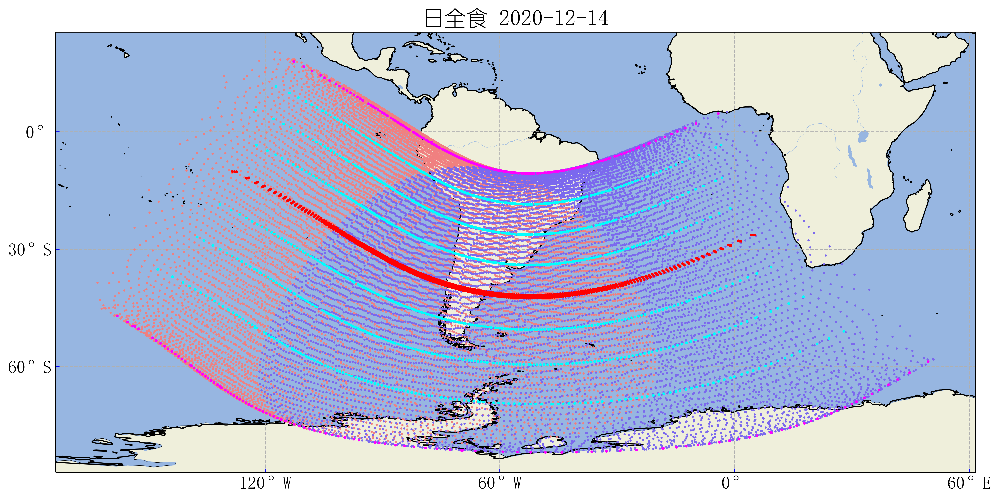

In [61]:
x_extent = [ 0, 60, 120, 180, 240, 300, 360]
y_extent = [ -90,-60, -30, 0, 30, 60,90]

fig = plt.figure(figsize=(15, 15), dpi=600)  
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=meanlon))

ax.coastlines(resolution='50m')
ax.add_feature(cfeature.LAND)#添加陆地
ax.add_feature(cfeature.COASTLINE,lw = 0.3)#添加海岸线
ax.add_feature(cfeature.RIVERS,lw = 0.25)#添加河流
ax.add_feature(cfeature.LAKES)#指定湖泊颜色为红色#添加湖泊
ax.add_feature(cfeature.OCEAN)#添加海洋

ax.set_xticks(x_extent, crs=ccrs.PlateCarree())#添加经纬度
ax.set_yticks(y_extent, crs=ccrs.PlateCarree())

# 利用Formatter格式化刻度标签
lon_formatter = LongitudeFormatter(zero_direction_label=False)
lat_formatter = LatitudeFormatter()
ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)
ax.tick_params(color = 'blue',direction='in')
ax.grid(linestyle='--')

ax.plot(lon_1, lat_1, 'o', markersize=1, color='lightcoral', transform = ccrs.Geodetic())
ax.plot(lon_2, lat_2, 'o', markersize=1, color='mediumslateblue', transform = ccrs.Geodetic())

ax.plot(lonCenter, latCenter, 'o', markersize=1.5, color='red', transform = ccrs.Geodetic())
ax.plot(lonz1, latz1, 'o', markersize=1.5, color='magenta', transform = ccrs.Geodetic())
ax.plot(lonz4, latz4, 'o', markersize=1.5, color='magenta', transform = ccrs.Geodetic())
ax.plot(lonz2, latz2, 'o', markersize=1.5, color='red', transform = ccrs.Geodetic())
ax.plot(lonz3, latz3, 'o', markersize=1.5, color='red', transform = ccrs.Geodetic())

ax.plot(lonzx1, latzx1, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzy1, latzy1, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzx2, latzx2, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzy2, latzy2, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzx3, latzx3, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzy3, latzy3, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())

ax.set_title(name, fontsize = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
filename = name + 'PlateCarree' + '.png'
plt.savefig(filename, format='png',dpi=600)
plt.show();

D:\Software\anaconda3\lib\site-packages\cartopy\crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
D:\Software\anaconda3\lib\site-packages\cartopy\crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
D:\Software\anaconda3\lib\site-packages\cartopy\crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
D:\Software\anaconda3\lib\site-packages\cartopy\crs.py:402: ShapelyDeprecationWarning: Iteration over mult

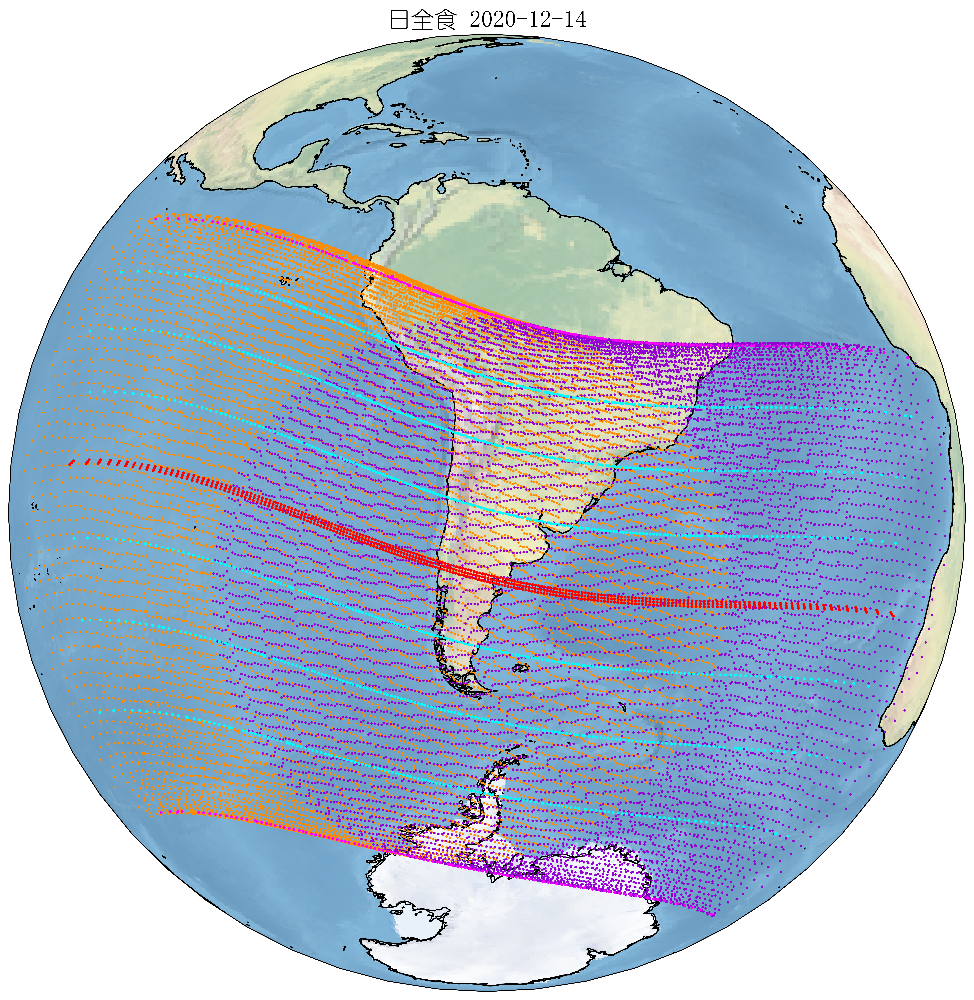

In [62]:
fig = plt.figure(figsize=(15, 15), dpi=600)  
ax = fig.add_subplot(1,1,1, projection=ccrs.Orthographic(central_latitude=meanlat, central_longitude=meanlon))

ax.coastlines(resolution='50m')
ax.stock_img()
ax.coastlines()


ax.plot(lon_1, lat_1, 'o', markersize=1, color='darkorange', transform = ccrs.Geodetic())
ax.plot(lon_2, lat_2, 'o', markersize=1, color='darkviolet', transform = ccrs.Geodetic())

ax.plot(lonCenter, latCenter, 'o', markersize=1.5, color='red', transform = ccrs.Geodetic())
ax.plot(lonz1, latz1, 'o', markersize=1.5, color='magenta', transform = ccrs.Geodetic())
ax.plot(lonz4, latz4, 'o', markersize=1.5, color='magenta', transform = ccrs.Geodetic())
ax.plot(lonz2, latz2, 'o', markersize=1.5, color='red', transform = ccrs.Geodetic())
ax.plot(lonz3, latz3, 'o', markersize=1.5, color='red', transform = ccrs.Geodetic())

ax.plot(lonzx1, latzx1, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzy1, latzy1, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzx2, latzx2, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzy2, latzy2, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzx3, latzx3, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())
ax.plot(lonzy3, latzy3, 'o', markersize=1.5, color='aqua', transform = ccrs.Geodetic())

ax.set_title(name, fontsize = 20)
filename = name + 'Orthographic'+ '.png'
plt.savefig(filename, format='png',dpi=600)
plt.show();

## 验证结果
[nadc.china-vo.org](https://nadc.china-vo.org/eclipse/?map=arcgis&mapid=5cd32b831bfb43d08e5ee75e7b40d53d&mode=3d)

[solar eclipse](https://eclipse.gsfc.nasa.gov/solar.html)

![jupyter](https://eclipse.gsfc.nasa.gov/SEplot/SEplot2001/SE2020Dec14T.GIF)
![jupyter](https://eclipse.gsfc.nasa.gov/SEplot/SEplot2001/SE2023Oct14A.GIF)
![jupyter](https://eclipse.gsfc.nasa.gov/SEplot/SEplot2001/SE2032Nov03P.GIF)